In [24]:
import numpy as np
import cv2
from sklearn.cluster import KMeans
from keras.applications.vgg19 import VGG19, preprocess_input
from keras.models import Model
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds

num_clusters = 100  # Change this number as needed
images_per_cluster = 500  # Change this number as needed


In [25]:

# Load VGG19 model with include_top=False
base_model = VGG19(weights='imagenet', include_top=False)
model = Model(inputs=base_model.input, outputs=base_model.get_layer('block5_pool').output)

<class 'numpy.ndarray'>
(50000, 32, 32, 3)


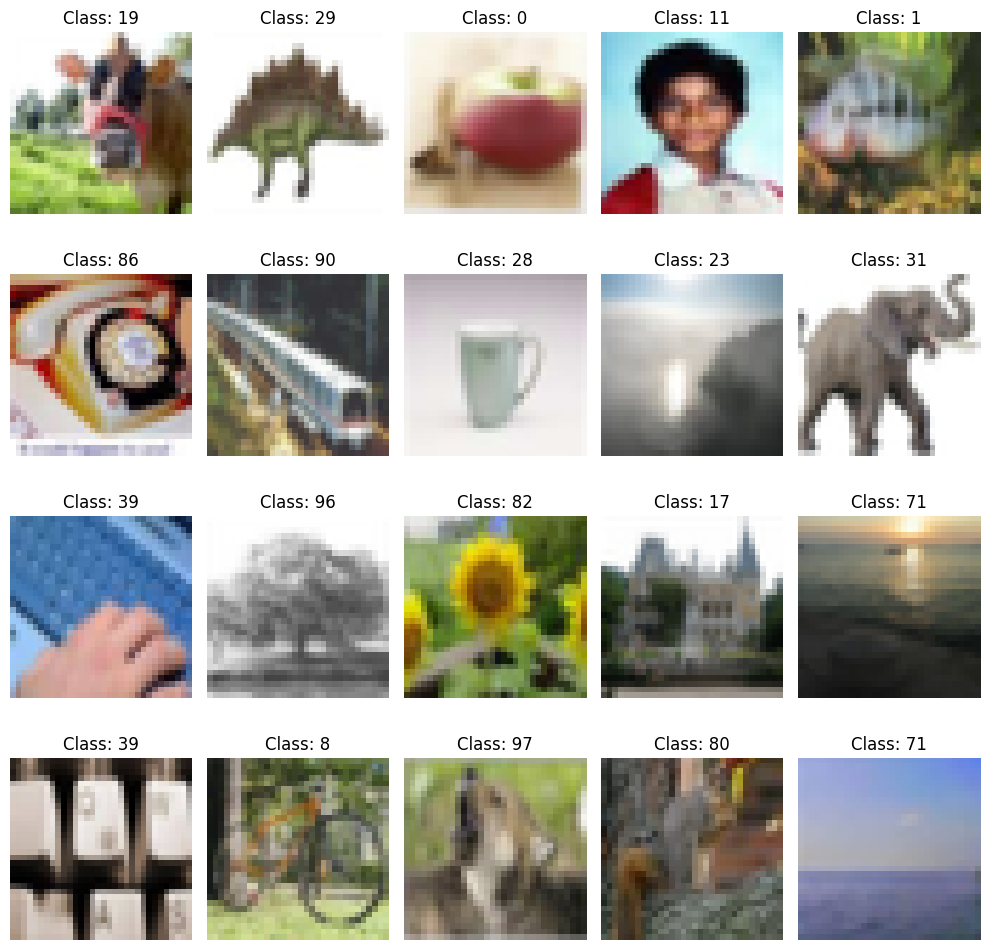

In [26]:
# Extract images and labels from the tfds dataset
(x_train, y_train), (_, _) = tf.keras.datasets.cifar100.load_data(label_mode='fine')

print(type(x_train))
print(np.shape(x_train))

# Display the first 20 images
plt.figure(figsize=(10, 10))
for i in range(20):
    plt.subplot(4, 5, i + 1)
    plt.imshow(x_train[i])
    plt.title(f"Class: {y_train[i][0]}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:

image_paths = []
for i in range(num_clusters * images_per_cluster // 2):
    img = x_train[i]
    img = preprocess_input(img)
    features = model.predict(np.expand_dims(img, axis=0))
    image_paths.append(features.flatten())
    print(i)



In [ ]:

# Save the extracted features to a file
np.save('/content/image_features_1.npy', image_paths)


(250, 512)


In [27]:
# Load the two numpy arrays from the files
array1 = np.load('/content/image_features_1.npy')
array2 = np.load('/content/image_features_2.npy')

# Concatenate the arrays along the specified axis (0 for rows)
image_paths = np.concatenate((array1, array2), axis=0)

In [28]:
print(np.shape(image_paths))

(50000, 512)


In [29]:
# Perform K-Means clustering on the extracted image features
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
labels = kmeans.fit_predict(image_paths)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [30]:
print(len(labels))

50000


In [31]:
# Create a dictionary to hold the clusters
clusters = {}
for i, label in enumerate(labels):
    if label not in clusters:
        clusters[label] = []
    clusters[label].append(i)

print(type(clusters))
print(clusters)

<class 'dict'>
{12: [0, 46, 155, 279, 298, 326, 368, 386, 389, 506, 533, 560, 569, 722, 761, 828, 858, 877, 911, 955, 974, 976, 1052, 1119, 1153, 1331, 1356, 1368, 1401, 1457, 1518, 1577, 1605, 1608, 1641, 1650, 1839, 1861, 1964, 1983, 2067, 2105, 2106, 2162, 2199, 2219, 2270, 2293, 2339, 2458, 2526, 2551, 2582, 2717, 2726, 2765, 2877, 2880, 2907, 3011, 3058, 3092, 3166, 3172, 3218, 3253, 3304, 3322, 3351, 3442, 3667, 3725, 3812, 3817, 3830, 3891, 4025, 4049, 4146, 4291, 4437, 4600, 4675, 4730, 4750, 4841, 4861, 4898, 4970, 5049, 5059, 5083, 5196, 5268, 5480, 5522, 5619, 5640, 5740, 5798, 6058, 6157, 6172, 6285, 6342, 6348, 6459, 6512, 6620, 6648, 6692, 6706, 6727, 6767, 6866, 7105, 7112, 7134, 7158, 7211, 7265, 7323, 7326, 7366, 7370, 7448, 7458, 7517, 7603, 7655, 7694, 7734, 7789, 7885, 7916, 7973, 8005, 8133, 8209, 8232, 8316, 8455, 8608, 8643, 8668, 8744, 8747, 8985, 8988, 9023, 9031, 9098, 9201, 9233, 9376, 9383, 9413, 9420, 9518, 9610, 9618, 9638, 9667, 9690, 9802, 9821, 9886, 99

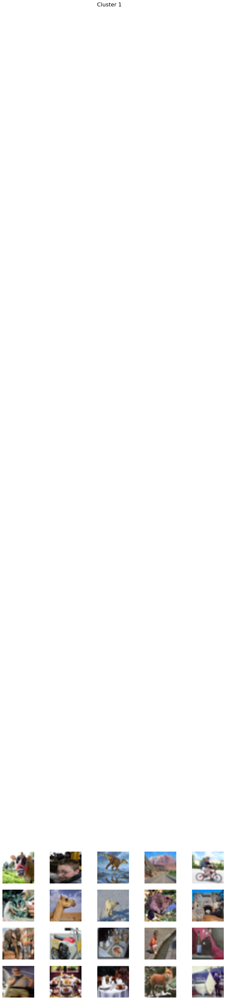

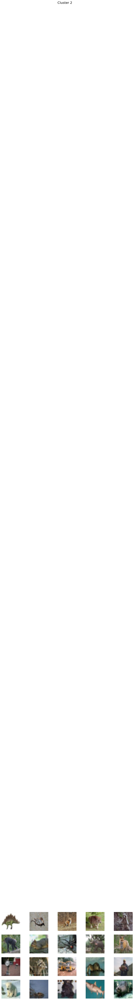

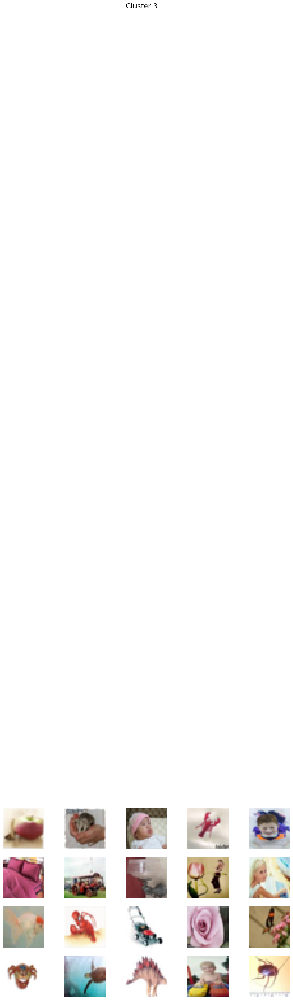

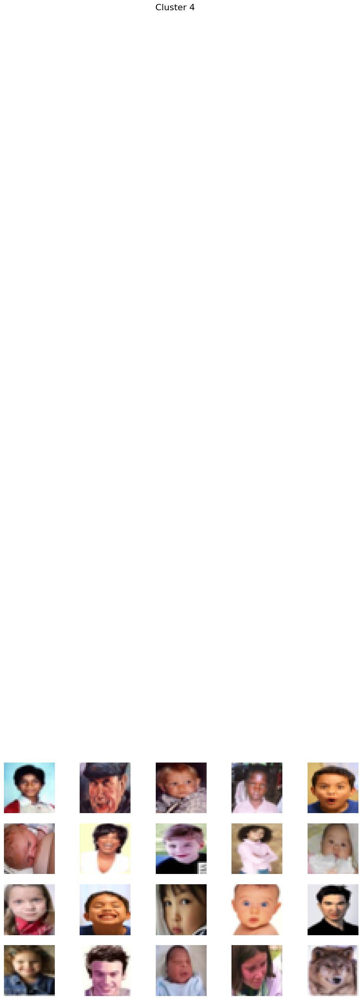

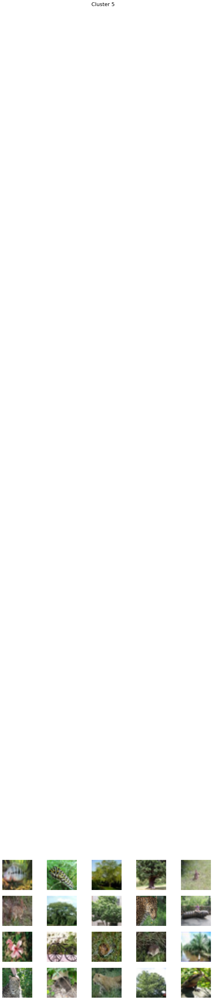

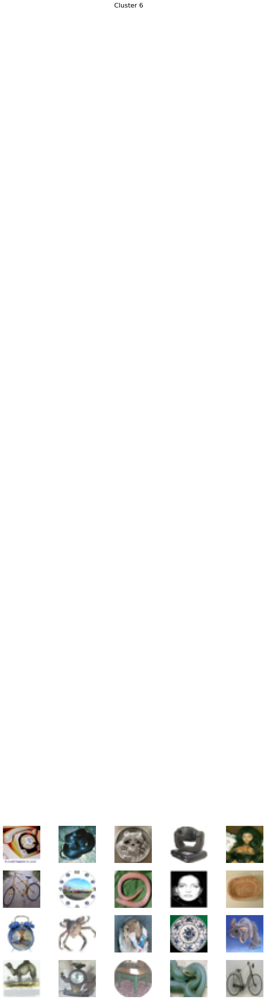

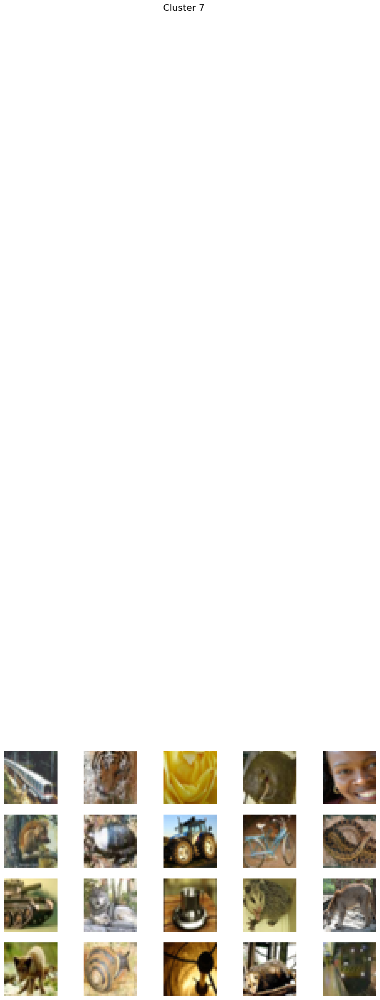

ValueError: ignored

<Figure size 1200x88400 with 20 Axes>

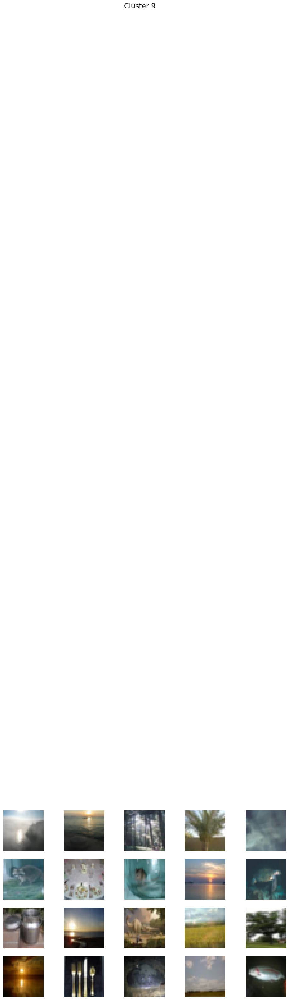

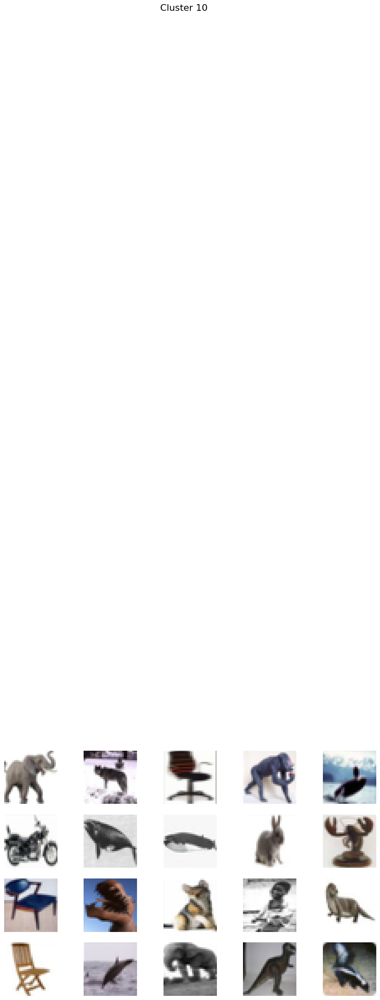

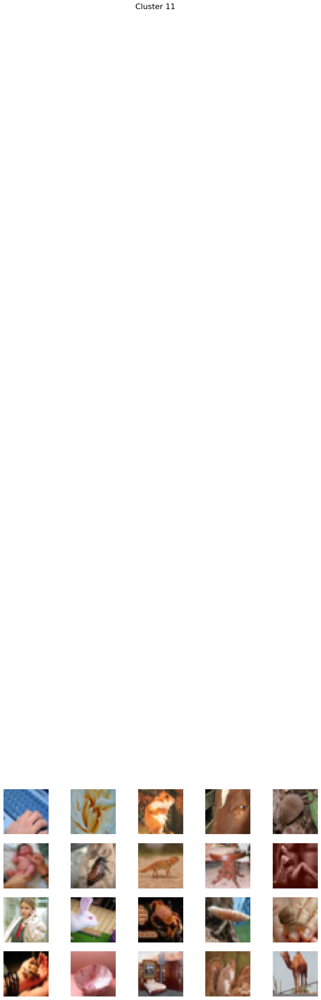

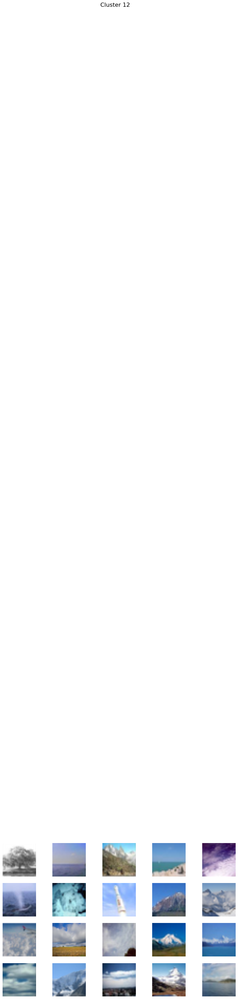

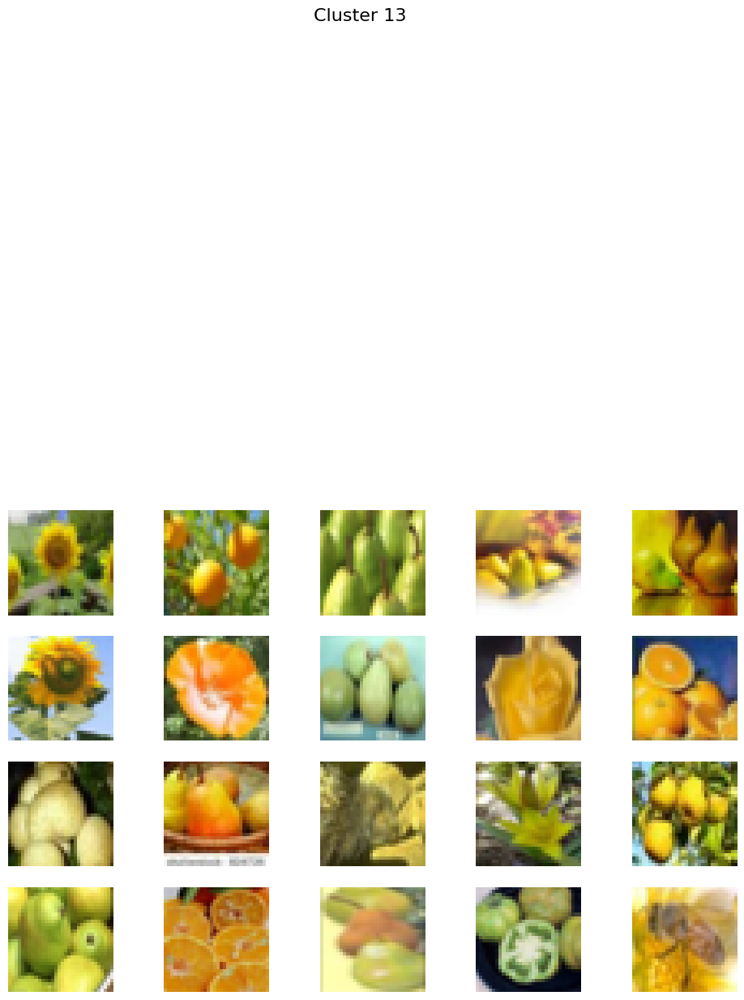

...

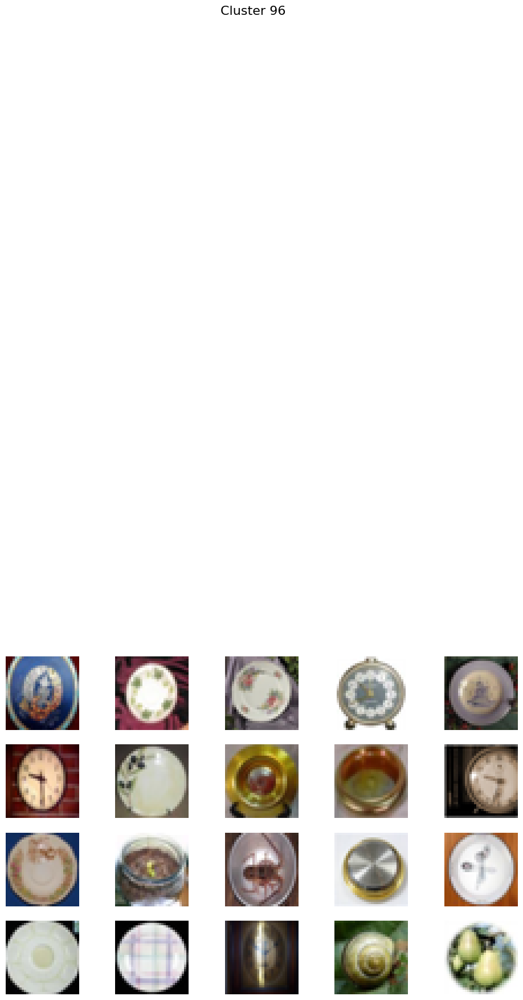

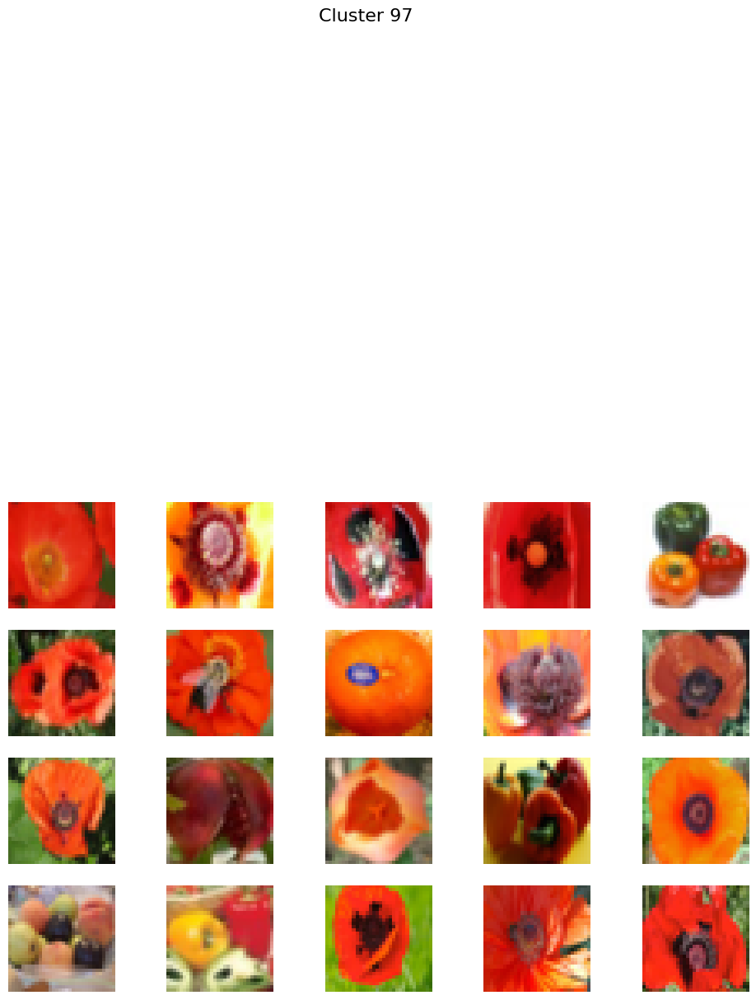

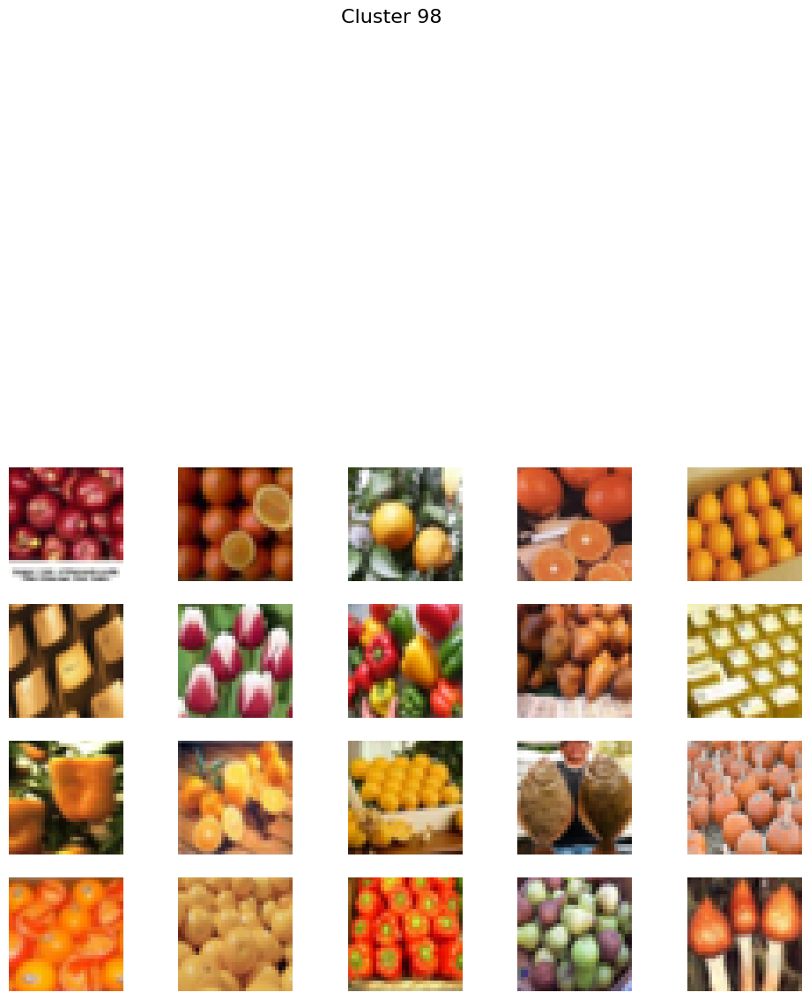

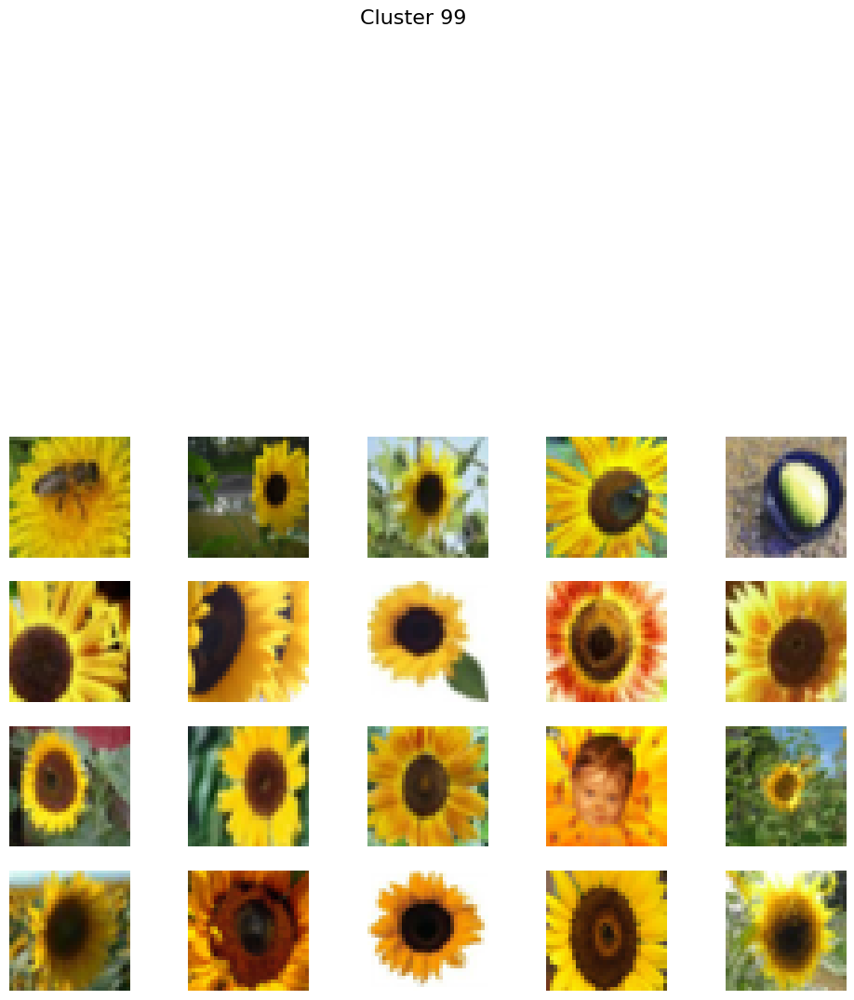

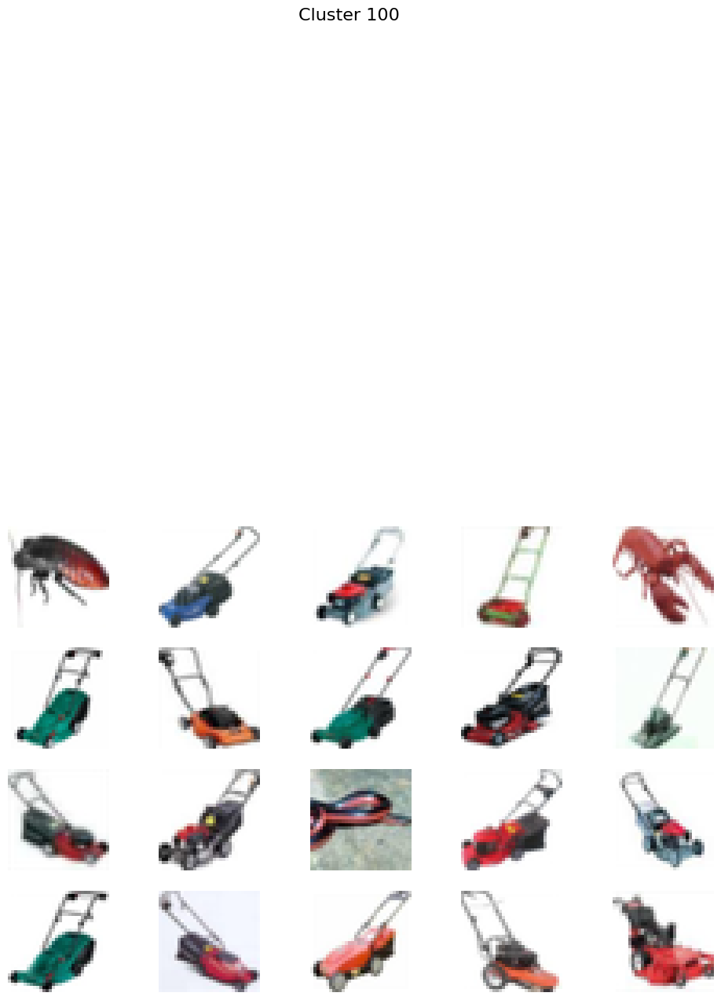

In [34]:
# Visualize the clusters one by one
for i, cluster in enumerate(clusters):
    cluster_indices = clusters[cluster]

    # Calculate the number of rows needed for this cluster
    num_rows = (len(cluster_indices) + 4) // 5  # 5 images per row

    plt.figure(figsize=(12, 2 * num_rows))  # Adjust the figure size based on the number of rows

    # Set the title outside the loop for proper display
    plt.suptitle(f"Cluster {i + 1}", fontsize=16)

    for j, idx in enumerate(cluster_indices[:20]):
        plt.subplot(num_rows, 5, j + 1)  # 5 images per row
        plt.imshow(x_train[idx])
        plt.axis('off')
    plt.show()